In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.python.keras.layers import Input, Dense, Dropout
from tensorflow.python.keras import Model
from tensorflow.python.keras.metrics import MeanSquaredError, RootMeanSquaredError
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.python.keras.optimizers import adam_v2
from matplotlib import pyplot as plt

2023-02-21 16:57:48.193732: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-21 16:57:48.864116: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-02-21 16:57:48.864153: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-02-21 16:57:50.285266: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-

Get test data

In [2]:
train_df = pd.read_csv('training_6_category_1/preprocessed.csv')
train_df['type_sensor_1'] = train_df['type_sensor_1'].astype('category')
train_df['type_sensor_2'] = train_df['type_sensor_2'].astype('category')
train_df['type_sensor_3'] = train_df['type_sensor_3'].astype('category')

X = train_df.drop(columns=['latitude_aircraft', 'longitude_aircraft', 'geoAltitude', 'baroAltitude'])
Y = train_df[['latitude_aircraft', 'longitude_aircraft', 'geoAltitude', 'baroAltitude']]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

# Tensorflow

Evaluate different DNN

In [3]:
np.random.seed(1)

In [4]:
def get_wide_model(input_shape, nodes):
    input_tensor = Input(shape=input_shape)
    # drop_out_tensor = Dropout(.2)(input_tensor)
    hidden_tensor = Dense(nodes)(input_tensor)
    output_tensor = Dense(len(Y.columns))(hidden_tensor)
    model = Model(input_tensor, output_tensor)

    return model

In [5]:
early_stopping = EarlyStopping(monitor='val_loss', patience=3)
optimizer = adam_v2.Adam(learning_rate=0.001)
histories = []
nodes = [100, 200, 250, 300]

In [6]:
for num in nodes:
    model_checkpoint = ModelCheckpoint(''.join(['models/best_aircraft_model', str(num), '.hdf5']), save_best_only = True)
    wide_model = get_wide_model((len(X.columns),), num)
    wide_model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=[RootMeanSquaredError()])
    histories.append(wide_model.fit(X_train, y_train, epochs=30, validation_data=(X_test, y_test), callbacks=[early_stopping, model_checkpoint]))

    wide_model.save(''.join(['models/nn_model_aircraft_pred_wide_', str(num), '.h5']))
    preds = pd.DataFrame.from_records(wide_model.predict(X_test))
    train_vs_test = pd.concat([y_test, preds], axis=1)
    train_vs_test.to_csv(''.join(['preds/nn_model_aircraft_pred_wide_', str(num), '.csv']))

2023-02-21 16:58:02.725204: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2023-02-21 16:58:02.725227: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-02-21 16:58:02.725278: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (lisbert-TP): /proc/driver/nvidia/version does not exist
2023-02-21 16:58:02.725956: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Epoch 1/30
40359/40359 [==============================] - 66s 2ms/step - loss: 6250568.0000 - root_mean_squared_error: 2500.1135 - val_loss: 4793640.5000 - val_root_mean_squared_error: 2189.4385

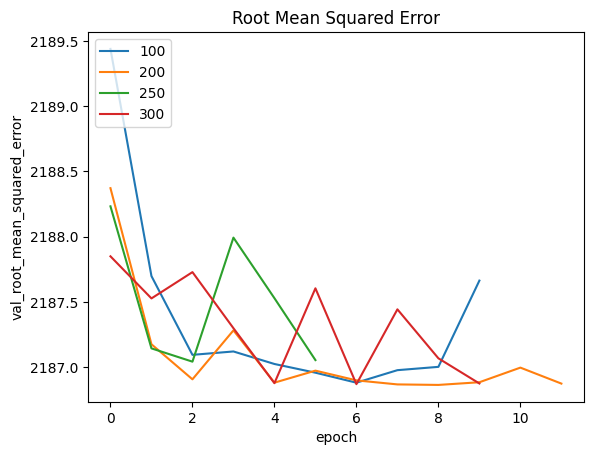

In [7]:
plt.figure()
for i, mh in enumerate(histories):
    plt.plot(mh.history['val_root_mean_squared_error'])
plt.title('Root Mean Squared Error')
plt.ylabel('val_root_mean_squared_error')
plt.xlabel('epoch')
plt.legend(nodes, loc='upper left')
plt.savefig('plots/rmse_wide.svg', format='svg')
plt.show()

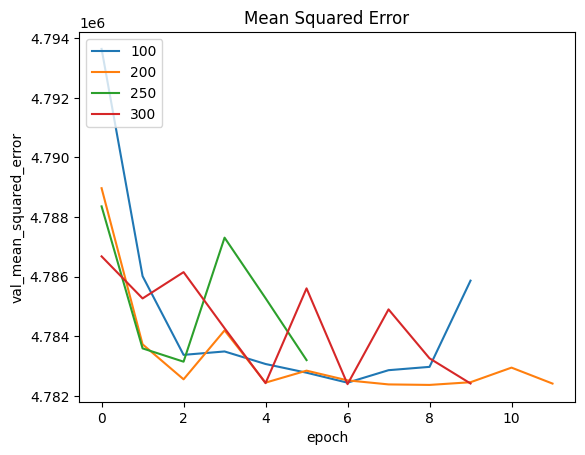

In [8]:
plt.figure()
for i, mh in enumerate(histories):
    plt.plot(mh.history['val_loss'])
plt.title('Mean Squared Error')
plt.ylabel('val_mean_squared_error')
plt.xlabel('epoch')
plt.legend(nodes, loc='upper left')
plt.savefig('plots/mae_wide.svg', format='svg')
plt.show()

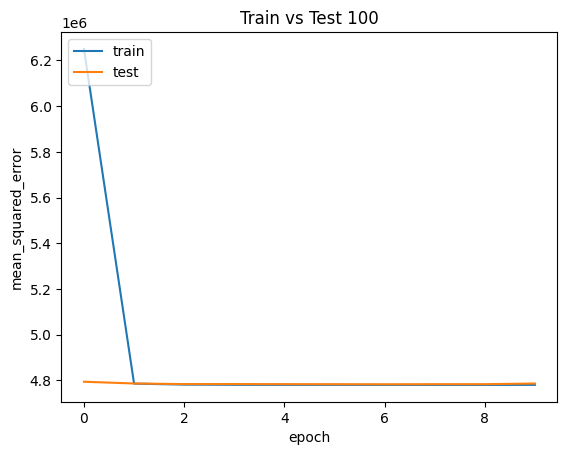

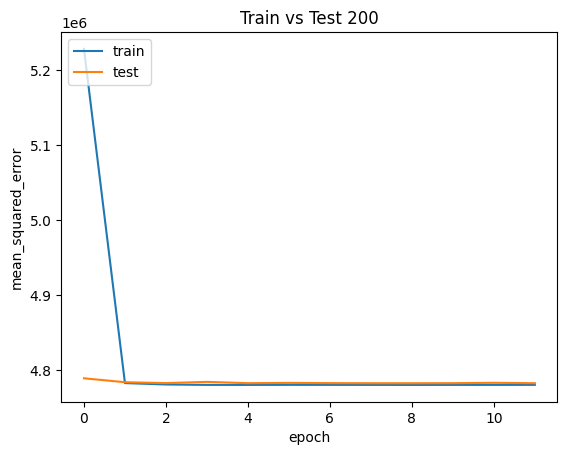

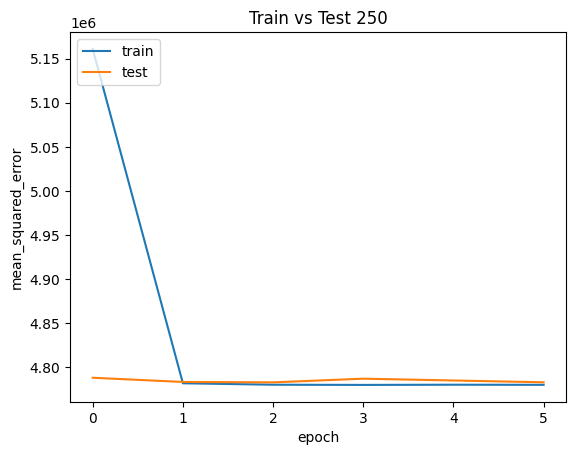

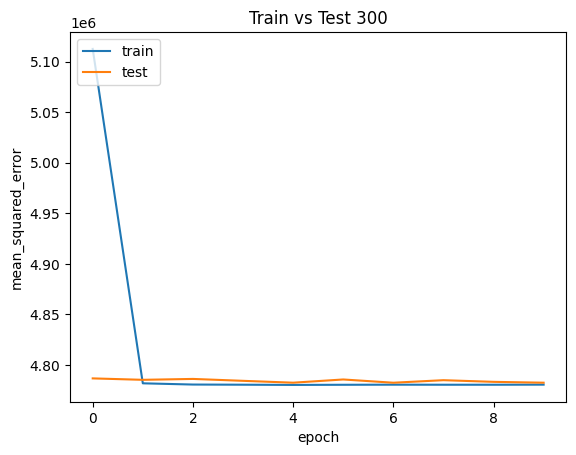

In [11]:
for i, mh in enumerate(histories):
    plt.figure()
    plt.plot(mh.history['loss'])
    plt.plot(mh.history['val_loss'])
    plt.title('Train vs Test ' + str(nodes[i]))
    plt.ylabel('mean_squared_error')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.savefig(''.join(['plots/mae_train_vs_test_', str(nodes[i]), '.svg']), format='svg')
    plt.show()